# Descomposicion en tendencia y estacionalidad aditiva y multiplicativa

In [ ]:
import torch
torch.cuda.is_available()

True

In [ ]:
import tensorflow as tf
from tensorflow import keras

In [ ]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Num GPUs Available:  1


In [ ]:
tf.test.is_built_with_cuda()

True

In [ ]:
pip install etsformer-pytorch    # etsformer es una libreria que usa transformadores para series de tiempo.

In [ ]:
from etsformer_pytorch import ETSFormer

In [ ]:
# importando librerias relevantes

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
from itertools import product
import os
import math
import itertools
import warnings
from collections import defaultdict
from scipy.stats import boxcox
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
warnings.filterwarnings('ignore')

plt.style.use('fivethirtyeight')
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20

%matplotlib inline

In [ ]:
# se definen dos funciones para testear la estacinariedad de la serie. Se usa un alpha de 0.05 para el test de hipótesis.
# Test Dickey-Fuller (adf): la hipótesis nula es la no estacionariedad. p pequeño = estacionario
# Test Kwiatkowski–Phillips–Schmidt–Shin (KPSS): la hipotesis nula es la estacionariedad/ estacionariedad en tendencia. p pequeño = no estacionario/ no estacionario en tendencia

def is_stationary_adf(y):

    # "HO: Non-stationary"
    # "H1: Stationary"

    p_value = sm.tsa.stattools.adfuller(y)[1]
    if p_value < 0.05:
        print(F"ADF Result: Stationary (H0: non-stationary, p-value: {round(p_value, 3)})")
    else:
        print(F"ADF Result: Non-Stationary (H0: non-stationary, p-value: {round(p_value, 3)})")

def is_stationary_kpss(y, regression='c'):

    # "HO: Stationary/ trend stationary"
    # "H1: Non-stationary"

    p_value = kpss(y, regression=regression)[1]
    if p_value < 0.05:
        print(F"KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: {round(p_value, 3)})")
    else:
        print(F"KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: {round(p_value, 3)})")


# El test Breusch-Pagan testea la heterocedasticidad de la serie. La hipotesis nula es la presencia de homocedasticity. p pequeño = heterocedasticidad
def bp_test(y):
    serie = pd.Series(y)
    X = pd.Series(range(len(serie)), index=serie.index)
    y = serie                # Valores de la serie
    X = add_constant(X)      # Necesario para el test
    model = OLS(y, X).fit()
    residuals = model.resid
    bp_result = het_breuschpagan(residuals, model.model.exog)
    print("p-valor Test de Breusch-Pagan:", bp_result[3])



In [ ]:
# Descomposicion en componentes y evaluación de estacionariedad

def ts_decompose(y, model="additive", stationary=False, suptitle="", period=None):
    result = seasonal_decompose(y, model=model, period=period)
    fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
    fig.set_figheight(15)
    fig.set_figwidth(70)

    axes[0].set_title("Decomposition for " + model + " model")
    axes[0].plot(y, 'k', label='Original ' + model, lw=0.7)
    axes[0].legend(loc='upper left')

    axes[1].plot(result.trend, label='Trend', lw=0.7)
    axes[1].legend(loc='upper left')

    axes[2].plot(result.seasonal, 'g', label='Seasonality & Mean: ' + str(round(result.seasonal.mean(), 4)), lw=0.7)
    axes[2].legend(loc='upper left')

    axes[3].plot(result.resid, 'r', label='Residuals & Mean: ' + str(round(result.resid.mean(), 4)), lw=0.7)
    axes[3].legend(loc='upper left')
    plt.suptitle(suptitle, size=25)
    plt.show(block=True)

    if stationary:
        is_stationary_adf(y)
        is_stationary_kpss(y)
        is_stationary_kpss(y, 'ct')
        bp_test(y)

In [ ]:
drive.mount('/content/drive')
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/output_knn.csv')#, delimiter=';')
df.info()

Mounted at /content/drive
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160699 entries, 0 to 160698
Data columns (total 29 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Unnamed: 0               160699 non-null  int64  
 1   year                     160699 non-null  float64
 2   month                    160699 non-null  float64
 3   day                      160699 non-null  float64
 4   day_of_year              160699 non-null  float64
 5   day_of_week              160699 non-null  float64
 6   hour                     160699 non-null  float64
 7   minute                   160699 non-null  float64
 8   traffic_flow             160699 non-null  float64
 9   presion                  160699 non-null  float64
 10  temp                     160699 non-null  float64
 11  humedad                  160699 non-null  float64
 12  viento_vel               160699 non-null  float64
 13  viento_dir               160699 n

In [ ]:
df.head()

,Unnamed: 0,year,month,day,day_of_year,day_of_week,hour,minute,traffic_flow,presion,...,st,ic,et,rad,uv,period_of_day_madrugada,period_of_day_mañana,period_of_day_noche,period_of_day_siesta,period_of_day_tarde
0,0,0.0,0.636364,0.0,0.580822,0.5,0.000000,0.000000,0.286472,0.569804,...,0.420131,0.384276,0.007843,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,1,0.0,0.636364,0.0,0.580822,0.5,0.000000,0.333333,0.297082,0.568466,...,0.417943,0.381756,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,2,0.0,0.636364,0.0,0.580822,0.5,0.000000,0.666667,0.254642,0.569135,...,0.415755,0.380496,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,3,0.0,0.636364,0.0,0.580822,0.5,0.000000,1.000000,0.251989,0.569661,...,0.409190,0.374197,0.000000,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,4,0.0,0.636364,0.0,0.580822,0.5,0.043478,0.000000,0.213528,0.571142,...,0.398249,0.362858,0.011765,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
vehiculos = df[['traffic_flow', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']]

N = len(vehiculos)
inicio = pd.to_datetime('2019-08-01 00:15') # fecha del primer dato. se usa el formato datetime
rango_fechas = pd.date_range(start=inicio, periods=N, freq='15T') # se crea el indice a intervalos de 15 minutos
vehiculos.index = rango_fechas

print(vehiculos.head())
print(vehiculos.index.freq)

                     traffic_flow   presion      temp   humedad  viento_vel  \
2019-08-01 00:15:00      0.286472  0.569804  0.390805  0.489583    0.023041   
2019-08-01 00:30:00      0.297082  0.568466  0.388506  0.406250    0.025346   
2019-08-01 00:45:00      0.254642  0.569135  0.386207  0.364583    0.029954   
2019-08-01 01:00:00      0.251989  0.569661  0.379310  0.333333    0.027650   
2019-08-01 01:15:00      0.213528  0.571142  0.367816  0.302083    0.023041   

                     lluvia  
2019-08-01 00:15:00     0.0  
2019-08-01 00:30:00     0.0  
2019-08-01 00:45:00     0.0  
2019-08-01 01:00:00     0.0  
2019-08-01 01:15:00     0.0  
<15 * Minutes>


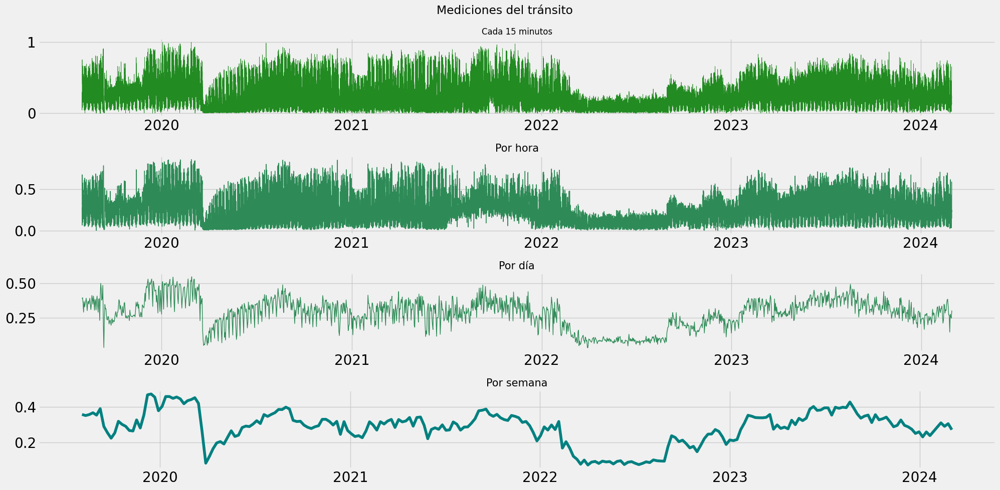

In [ ]:
# se plotean la cantidad de vehiculos cada 15 minutos (dataset original), por hora, por dia y por semana

semanal = vehiculos.resample('W').mean()
diario = vehiculos.resample('D').mean()
horario = vehiculos.resample('H').mean()
original = vehiculos.copy()

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(20, 10))

# original
axes[0].plot(vehiculos['traffic_flow'], color='forestgreen', lw=0.5)
axes[0].set_title('Cada 15 minutos', fontsize=12)

# por  hora
axes[1].plot(horario['traffic_flow'], color='seagreen', lw=1)
axes[1].set_title('Por hora', fontsize=15)

# por dia
axes[2].plot(diario['traffic_flow'], color='seagreen', lw=1)
axes[2].set_title('Por día', fontsize=15)

# por mes
axes[3].plot(semanal['traffic_flow'], color='teal')
axes[3].set_title('Por semana', fontsize=15)

# Mostrar el gráfico
plt.suptitle('Mediciones del tránsito')
plt.tight_layout()
plt.show()

---
## Descomposicion (dataset original)

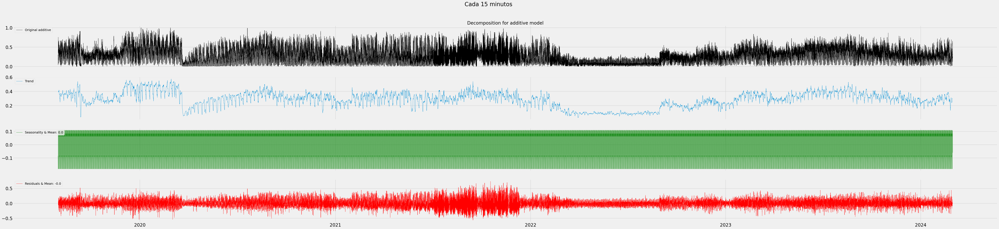

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Non-Stationary (HO: Stationary/ trend stationary, p-value: 0.01)
KPSS Result: Non-Stationary (HO: Stationary/ trend stationary, p-value: 0.01)


In [ ]:
# utilizamos el dataset resampleado por horas
for model in ["additive"]: # , "multiplicative"]:    # el multiplicativo no funciona si hay ceros o negativos.
    ts_decompose(original['traffic_flow'], model, stationary=True, suptitle='Cada 15 minutos', period=96)

Como KPSS = No estacionario y ADF = Estacionario, entonces nuestra serie de tiempo es estacionaria en diferencia y necesitamos diferenciar nuestra serie.

Vemos que la serie pareceria no tener una varianza constante (heterocedasticidad), asique vamos a usar el test de Breusch-Pagan, que tiene como hipotesis nula que los residuos tienen varianza constante, es decir la no heterocedasticidad de la serie.

In [ ]:
bp_test(original['traffic_flow'])

p-valor Test de Breusch-Pagan: 0.0


Como el p-valor es muy bajo (cercano a 0), podemos rechazar la hipotesis nula y afirmar que la serie tiene heterocedasticidad.

Para estabilizar la varianza, vamos a aplicar una transformación Box-Cox.

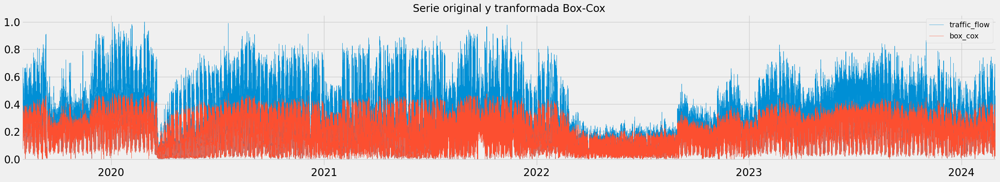

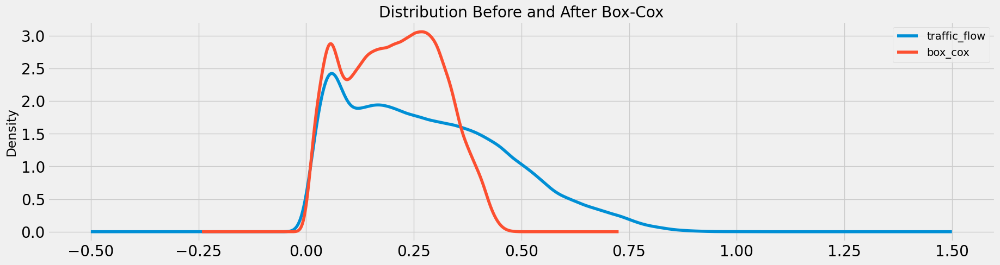

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Non-Stationary (HO: Stationary/ trend stationary, p-value: 0.01)
KPSS Result: Non-Stationary (HO: Stationary/ trend stationary, p-value: 0.01)
Box-Cox Lambda Value:  -1.107658719170916
p-valor Test de Breusch-Pagan: 5.087884293325496e-261


In [ ]:
# para aplicar boxcox

original_transf = original.copy()

# box-cox no funciona con valores no-positivos. Vamos a deplazar la serie 1 unidad hacia arriba para que no haya ceros
original_transf['box_cox'] = original_transf['traffic_flow'] + 1
original_transf['box_cox'], lamda = boxcox(original_transf.box_cox)
original_transf[['traffic_flow', 'box_cox']].plot(figsize=(30, 5), lw=0.5, title='Serie original y tranformada Box-Cox')
plt.show()

original_transf[['traffic_flow', 'box_cox']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox')
plt.show()

is_stationary_adf(original_transf[['box_cox']])
is_stationary_kpss(original_transf[['box_cox']], regression='c')
is_stationary_kpss(original_transf[['box_cox']], regression='ct')
print('Box-Cox Lambda Value: ', lamda)
bp_test(original_transf['box_cox'])

El test de heterocedasticidad no muestra mejoría con respecto a antes de la transformación. Esto puede deberse a que Box-Cox es más efectivo cuando la varianza no constante es proporcional a los valores de la serie.

Los modelos GARCH (Generalized Autoregressive Conditional Heteroskedasticity) podrian ser una buena opción para modelar la serie.

Aún así, primero usaremos la librería ETSformer, que se basa en el [paper](https://arxiv.org/abs/2202.01381) le los autores Gerald Woo, Chenghao Liu, Doyen Sahoo, Akshat Kumar y Steven Hoi. En este paper se propone un método para aplicar suavizado exponencial usando transfomers. Esto tiene la ventaja de ser más computacionalmente eficiente, ya que los transformes utilizan GPU.


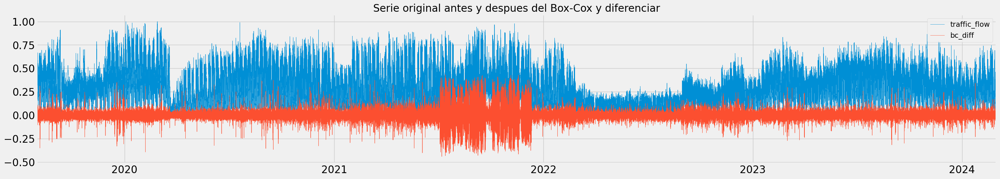

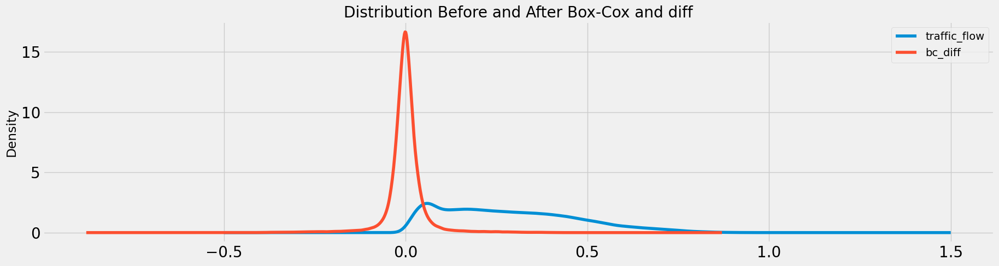

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
p-valor Test de Breusch-Pagan: 6.568291157470472e-17


In [ ]:
original_transf['bc_diff'] = original_transf.box_cox.diff()

original_transf[['traffic_flow', 'bc_diff']].plot(figsize=(30, 5), lw = 0.5, title='Serie original antes y despues del Box-Cox y diferenciar')
original_transf[['traffic_flow', 'bc_diff']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox and diff')
plt.show()

# el primer valor de la serie es un NaN depues de diferenciar
original_transf = original_transf.dropna()

is_stationary_adf(original_transf[['bc_diff']])
is_stationary_kpss(original_transf[['bc_diff']], regression='c')
is_stationary_kpss(original_transf[['bc_diff']], regression='ct')
bp_test(original_transf['bc_diff'])

---
## Descomposicion (dataset por horas)

In [ ]:
# utilizamos el dataset resampleado por horas
for model in ["additive"]: # , "multiplicative"]:    # el multiplicativo no funciona si hay ceros o negativos.
    ts_decompose(horario['traffic_flow'], model, stationary=True, suptitle='Por horas')

Output hidden; open in https://colab.research.google.com to view.

Como KPSS = No estacionario y ADF = Estacionario, entonces nuestra serie de tiempo es estacionaria en diferencia y necesitamos diferenciar nuestra serie.



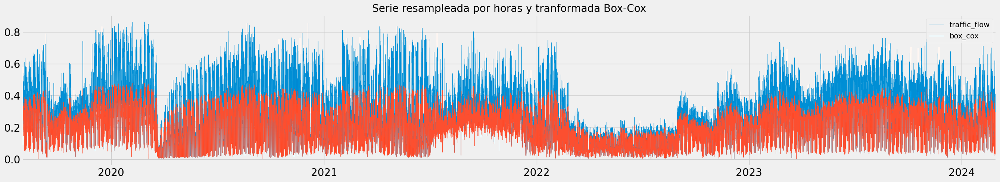

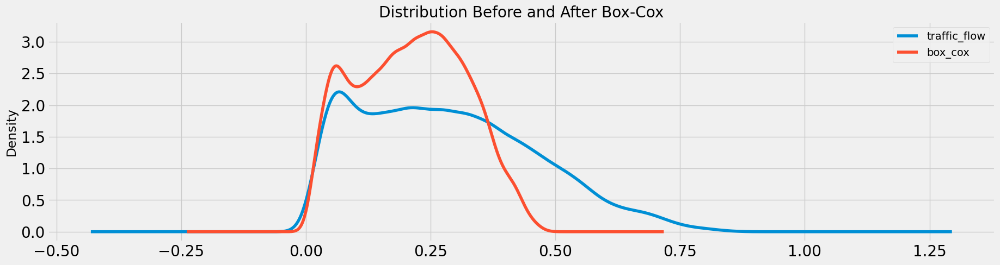

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
Box-Cox Lambda Value:  -0.8868074276590228
p-valor Test de Breusch-Pagan: 5.576264046668523e-72


In [ ]:
horario_transf = horario.copy()

# box-cox no funciona con valores no-positivos. Vamos a deplazar la serie 1 unidad hacia arriba para que no haya ceros
horario_transf['box_cox'] = horario_transf['traffic_flow'] + 1
horario_transf['box_cox'], lamda = boxcox(horario_transf.box_cox)
horario_transf[['traffic_flow', 'box_cox']].plot(figsize=(30, 5), lw=0.5, title='Serie resampleada por horas y tranformada Box-Cox')
plt.show()

horario_transf[['traffic_flow', 'box_cox']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox')
plt.show()

is_stationary_adf(horario_transf[['box_cox']])
is_stationary_kpss(horario_transf[['box_cox']], regression='c')
is_stationary_kpss(horario_transf[['box_cox']], regression='ct')
print('Box-Cox Lambda Value: ', lamda)
bp_test(horario_transf['box_cox'])

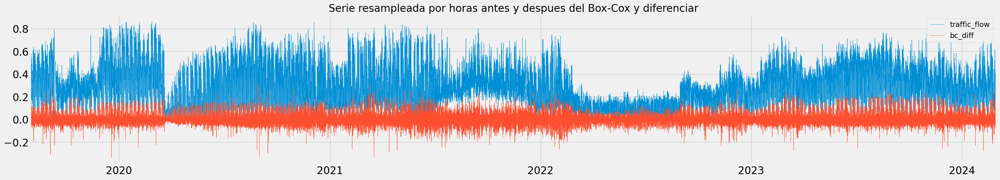

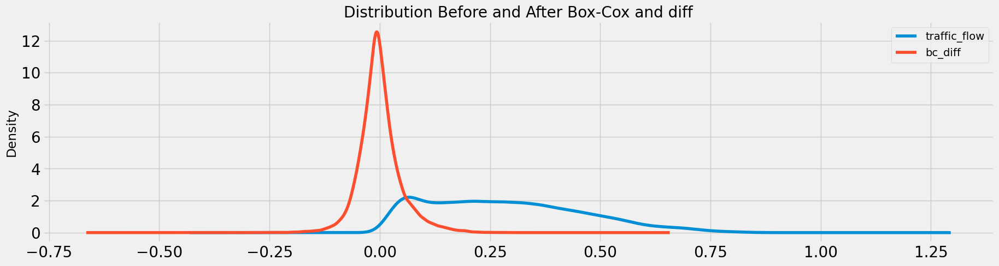

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
p-valor Test de Breusch-Pagan: 0.022014356453953186


In [ ]:
horario_transf['bc_diff'] = horario_transf.box_cox.diff()

horario_transf[['traffic_flow', 'bc_diff']].plot(figsize=(30, 5), lw = 0.5, title='Serie resampleada por horas antes y despues del Box-Cox y diferenciar')
horario_transf[['traffic_flow', 'bc_diff']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox and diff')
plt.show()

horario_transf.dropna(inplace=True)

is_stationary_adf(horario_transf[['bc_diff']])
is_stationary_kpss(horario_transf[['bc_diff']], regression='c')
is_stationary_kpss(horario_transf[['bc_diff']], regression='ct')
bp_test(horario_transf['bc_diff'])

Obtuvimos una serie estacionaria, confirmada por ambos tests.

-----
## Descomposicion (dataset por dia)

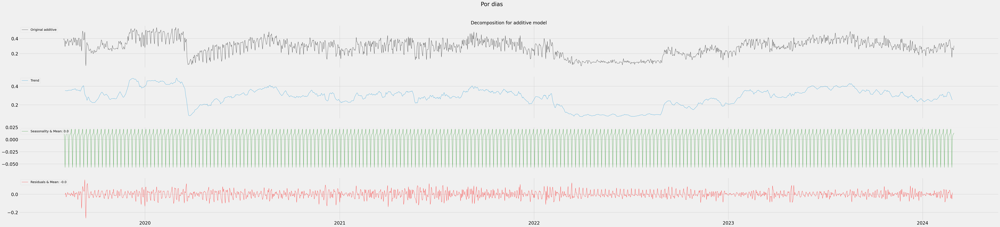

ADF Result: Stationary (H0: non-stationary, p-value: 0.03)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
p-valor Test de Breusch-Pagan: 0.9583095074393635


In [ ]:
# utilizamos el dataset resampleado dias
for model in ["additive"]: # , "multiplicative"]:    # el multiplicativo no funciona si hay ceros o negativos.
    ts_decompose(diario['traffic_flow'], model,stationary=True, suptitle='Por dias')

Como KPSS = No estacionario y ADF = Estacionario, entonces nuestra serie de tiempo es estacionaria en diferencia y necesitamos diferenciar nuestra serie.

El test Breusch-Pagan indica que la serie presenta heterocedasticidad, por lo que una transformación Box-Cox podria ayudar a estabilizar la varianza.


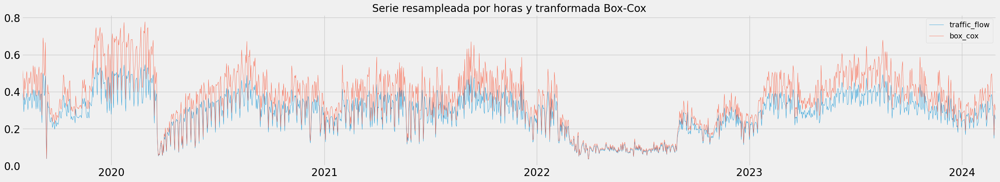

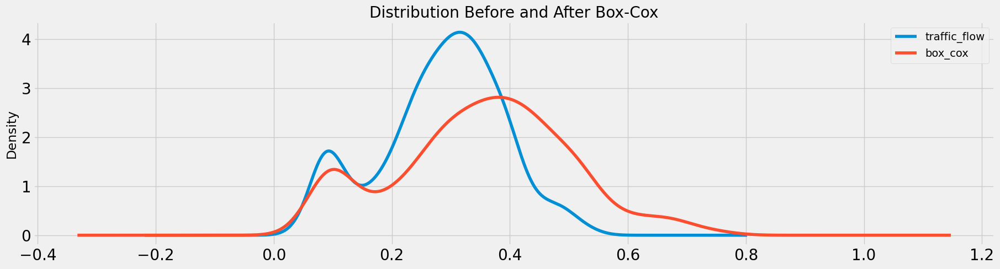

ADF Result: Stationary (H0: non-stationary, p-value: 0.022)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
Box-Cox Lambda Value:  2.4366289689854046
p-valor Test de Breusch-Pagan: 0.09138105963903802


In [ ]:
diario_transf = diario.copy()

# box-cox no funciona con valores no-positivos. Vamos a deplazar la serie 1 unidad hacia arriba para que no haya ceros
diario_transf['box_cox'] = diario_transf['traffic_flow'] + 1
diario_transf['box_cox'], lamda = boxcox(diario_transf.box_cox)
diario_transf[['traffic_flow', 'box_cox']].plot(figsize=(30, 5), lw=0.5, title='Serie resampleada por horas y tranformada Box-Cox')
plt.show()

diario_transf[['traffic_flow', 'box_cox']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox')
plt.show()

is_stationary_adf(diario_transf[['box_cox']])
is_stationary_kpss(diario_transf[['box_cox']], regression='c')
is_stationary_kpss(diario_transf[['box_cox']], regression='ct')
print('Box-Cox Lambda Value: ', lamda)
bp_test(diario_transf['box_cox'])

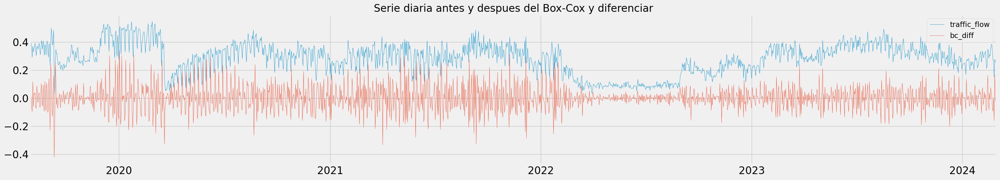

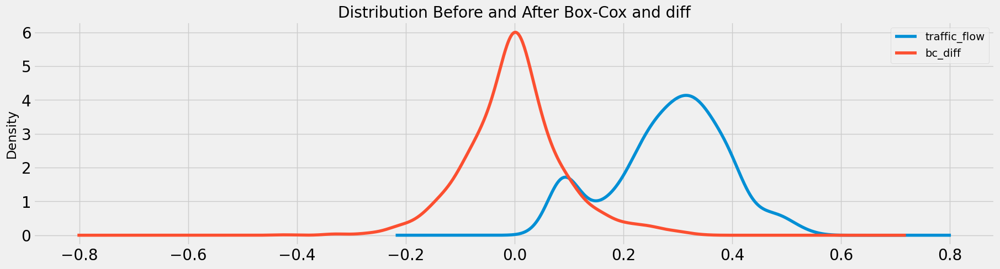

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
p-valor Test de Breusch-Pagan: 1.2454681559582892e-13


In [ ]:
diario_transf['bc_diff'] = diario_transf.box_cox.diff()

diario_transf[['traffic_flow', 'bc_diff']].plot(figsize=(30, 5), lw = 0.5, title='Serie diaria antes y despues del Box-Cox y diferenciar')
diario_transf[['traffic_flow', 'bc_diff']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox and diff')
plt.show()

diario_transf.dropna(inplace=True)

is_stationary_adf(diario_transf[['bc_diff']])
is_stationary_kpss(diario_transf[['bc_diff']], regression='c')
is_stationary_kpss(diario_transf[['bc_diff']], regression='ct')
bp_test(diario_transf['bc_diff'])

Obtuvimos una serie estacionaria, confirmada por ambos tests.

El Box-Cox junto con la diferenciación fueron efectivos para estabilizar la varianza, según el test BP.

---
## Descomposicion (dataset por semana)

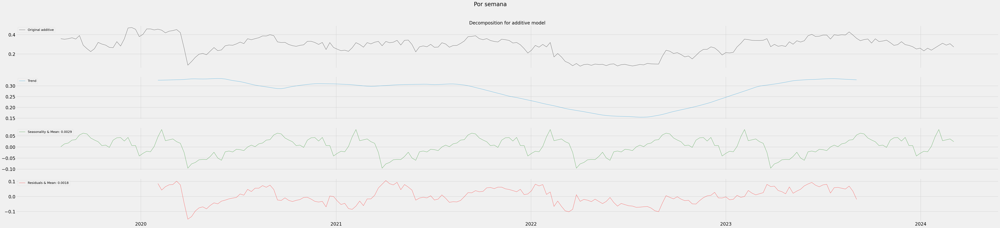

ADF Result: Stationary (H0: non-stationary, p-value: 0.035)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
KPSS Result: Non-Stationary (H0: Stationary/ trend stationary, p-value: 0.01)
p-valor Test de Breusch-Pagan: 0.2389692915856841


In [ ]:
# utilizamos el dataset resampleado dias
for model in ["additive"]: # , "multiplicative"]:    # el multiplicativo no funciona si hay ceros o negativos.
    ts_decompose(semanal['traffic_flow'], model,stationary=True, suptitle='Por semana')

El test KPSS nos indica que la serie es no estacionaria en tendencia. Para eliminar la tendendencia podemos diferenciar la serie.

In [ ]:
semanal_transf = semanal.copy()

# # box-cox no funciona con valores no-positivos. Vamos a deplazar la serie 1 unidad hacia arriba para que no haya ceros
# semanal_transf['box_cox'] = semanal_transf['traffic_flow'] + 1
# semanal_transf['box_cox'], lamda = boxcox(semanal_transf.box_cox)
# semanal_transf[['traffic_flow', 'box_cox']].plot(figsize=(30, 5), lw=0.5, title='Serie semanal y tranformada Box-Cox')
# plt.show()

# semanal_transf[['traffic_flow', 'box_cox']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox')
# plt.show()

# is_stationary_adf(semanal_transf[['box_cox']])
# is_stationary_kpss(semanal_transf[['box_cox']], regression='c')
# is_stationary_kpss(semanal_transf[['box_cox']], regression='ct')
# print('Box-Cox Lambda Value: ', lamda)
# bp_test(semanal_transf['box_cox'])

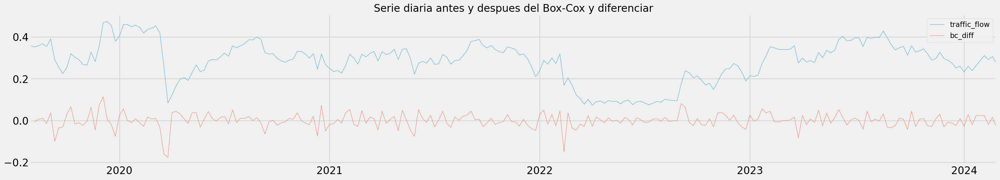

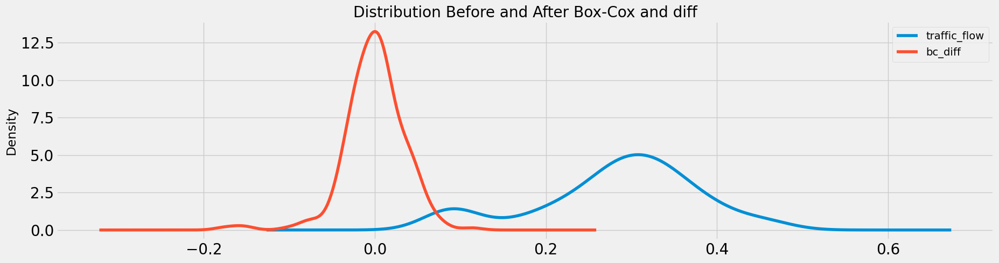

ADF Result: Stationary (H0: non-stationary, p-value: 0.0)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
KPSS Result: Stationary (H0: Stationary/ trend stationary, p-value: 0.1)
p-valor Test de Breusch-Pagan: 0.011220318663076373


In [ ]:
semanal_transf['bc_diff'] = semanal_transf.traffic_flow.diff()

semanal_transf[['traffic_flow', 'bc_diff']].plot(figsize=(30, 5), lw = 0.5, title='Serie diaria antes y despues del Box-Cox y diferenciar')
semanal_transf[['traffic_flow', 'bc_diff']].plot.kde(figsize=(20, 5), title= 'Distribution Before and After Box-Cox and diff')
plt.show()

semanal_transf.dropna(inplace=True)

is_stationary_adf(semanal_transf[['bc_diff']])
is_stationary_kpss(semanal_transf[['bc_diff']], regression='c')
is_stationary_kpss(semanal_transf[['bc_diff']], regression='ct')
bp_test(semanal_transf['bc_diff'])

Ahora la serie es estacionaria y presenta homocedasticidad.

## Suavizado exponencial

### Original (15 minutos)

In [ ]:
vehiculos_data = original_transf[['bc_diff', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']]

batch_size = 1                                      # Procesamos toda la serie como un solo batch
timesteps = len(vehiculos_data)                     # Número de pasos en el tiempo
features = 6                                        # Tenemos 6 features, una de la cant de vehiculos y 5 del clima


In [ ]:
# se define como train al 70% de los datos, como test el 25% y como validacion el 5%

train = int(len(vehiculos_data) * 0.7) -1
val = int(len(vehiculos_data) * 0.25 + train)
step = int(len(vehiculos_data) * 0.25)
forecast = len(vehiculos_data) - val

train_df = vehiculos_data[:train]
val_df = vehiculos_data[train : val]
test_df = vehiculos_data[val:]
train_val_df = vehiculos_data[:val]

# Convertir los datos en tensores de PyTorch
def df_to_tensor(dataframe):
    data = dataframe[['bc_diff', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']].values
    return torch.tensor(data, dtype=torch.float32).view(1, -1, data.shape[1])

train_ts = df_to_tensor(train_df)
val_ts = df_to_tensor(val_df)
test_ts = df_to_tensor(test_df)
train_val_ts = df_to_tensor(train_val_df)


# mandamos los tensores a la gpu
train_ts = train_ts.to(device)
val_ts = val_ts.to(device)
test_ts = test_ts.to(device)
train_val_ts = train_val_ts.to(device)


In [ ]:
num_steps_forecast = len(val_df)  # Número de pasos a predecir (mismo tamaño que el conjunto de validación)

# Definir los hiperparámetros a explorar, incluyendo batch_size
param_grid = {
    'model_dim': [8, 16, 32, 64, 128, 256, 512],     # Dimensión del modelo
    'layers': [1, 2, 3],                              # Número de capas
    'heads': [4, 8],                                  # Número de cabezas de atención
    'K': [2, 4, 8],                                   # Limitar K a frecuencias disponibles
    'dropout': [0.1, 0.2, 0.3],                       # Tasa de dropout
    'batch_size': [8, 16, 32, 64, 128, 256, 512]      # Tamaño de lote a optimizar
}

# Definir el grid de búsqueda
grid = list(product(*param_grid.values()))


# Función para evaluar el modelo con batching
def evaluate_model(model, train_ts, val_ts, batch_size, num_steps_forecast, squared=False):

    # si se pasa el parámetro squared = True, se usa el mean squared error.
    # por defecto se usa el mean absolute error

    predictions = []
    for i in range(0, len(train_ts), batch_size):
        batch_data = train_ts[:, i:i + batch_size, :]
        with torch.no_grad():
            batch_prediction = model(batch_data, num_steps_forecast=num_steps_forecast)
            predictions.append(batch_prediction)
    predictions = torch.cat(predictions, dim=1).cpu().numpy()
    traffic_flow_predictions = predictions[0, :, 0]  # Predicción de 'traffic_flow'
    val_true = val_ts.cpu().numpy()[0, :, 0]         # Valores verdaderos de 'traffic_flow'

    if squared == True:
      return mean_squared_error(val_true, traffic_flow_predictions)
    else:
      return mean_absolute_error(val_true, traffic_flow_predictions)

# Variables para almacenar los mejores hiperparámetros
best_error = float('inf')
best_params = None

# Realizar la búsqueda en el grid con try-except
for params in grid:
    model_dim, layers, heads, K, dropout, batch_size = params

    try:
        # Crear el modelo con los hiperparámetros actuales
        model = ETSFormer(
            time_features=features,
            model_dim=model_dim,
            embed_kernel_size=3,
            layers=layers,
            heads=heads,
            K=K,
            dropout=dropout
        ).to(device)

        # Evaluar el modelo en el conjunto de validación
        error = evaluate_model(model, train_ts, val_ts, batch_size, num_steps_forecast)

        # Guardar los mejores hiperparámetros
        if error < best_error:
            best_error = error
            best_params = params

        print(f"Evaluado: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}, Error={error}")

    except Exception as e:
        # Capturar cualquier error y continuar con la siguiente iteración
        print(f"Error con los parámetros: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}")
        print(f"Mensaje de error: {e}")

    # Liberar memoria de la GPU después de cada iteración
    torch.cuda.empty_cache()

# Mostrar los mejores hiperparámetros
print(f"Mejores hiperparámetros: {best_params}, Mejor Error: {best_error}")


Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=8, Error=0.1865813285112381
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=16, Error=0.29131028056144714
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=32, Error=0.15554265677928925
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=64, Error=0.9281391501426697
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=128, Error=0.4776940941810608
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=256, Error=0.466117799282074
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=512, Error=0.3457682728767395
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=8, Error=0.36999157071113586
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=16, Error=0.08851362019777298
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=32, Error=0.1070550605654

KeyboardInterrupt: 

In [ ]:
model_dim, layers, heads, K, dropout, batch_size = best_params[0], best_params[1], best_params[2], best_params[3], best_params[4], best_params[5]

In [ ]:
torch.cuda.empty_cache()

In [ ]:
#Mejores hiperparámetros: (64, 1, 4, 2, 0.1, 128), Mejor MAE: 0.024701055139303207
model_dim, layers, heads, K, dropout, batch_size = 64, 1, 4, 2, 0.1, 128

In [ ]:
# Mejores hiperparámetros: (16, 1, 4, 4, 0.1, 8), Mejor MSE: 0.0012210471322759986
model_dim, layers, heads, K, dropout, batch_size = 16, 1, 4, 4, 0.1, 8

In [ ]:
# creamos el modelo
model = ETSFormer(
    time_features = features,
    model_dim = model_dim,              # in paper they use 512
    embed_kernel_size = 3,              # kernel size for 1d conv for input embedding
    layers = layers,                    # number of encoder and corresponding decoder layers
    heads = heads,                      # number of exponential smoothing attention heads
    K = K,                              # num frequencies with highest amplitude to keep (attend to)
    dropout = dropout                   # dropout (in paper they did 0.2)
)


model = model.to(device)  # Mover el modelo a la GPU

In [ ]:
num_steps_forecast = len(test_ts[0])  # Número de pasos a predecir (mismo tamaño que el conjunto de validación)

# Función para predecir por lotes (batches)
def predict_in_batches(model, data, batch_size, num_steps_forecast):
    predictions = []
    for i in range(0, len(data), batch_size):
        batch_data = data[:, i:i + batch_size, :]
        with torch.no_grad():
            batch_prediction = model(batch_data, num_steps_forecast=num_steps_forecast)
            predictions.append(batch_prediction)

    # Combinar las predicciones en un tensor
    predictions = torch.cat(predictions, dim=1).cpu().numpy()

    # Filtrar solo las predicciones de 'traffic_flow'
    traffic_flow_predictions = predictions[0, :, 0]  # Suponiendo que 'traffic_flow' es la primera columna

    return traffic_flow_predictions

# Usar batching para reducir el tamaño de los datos procesados al mismo tiempo
prediction = predict_in_batches(model, test_ts, batch_size, num_steps_forecast)

# Configurar para liberar memoria no utilizada

# Mostrar las predicciones de traffic_flow
print("Predicciones de Traffic Flow:", prediction)

Predicciones de Traffic Flow: [ 0.04086283  0.02488769  0.01736801 ... -0.00218064  0.0107239
  0.00383647]


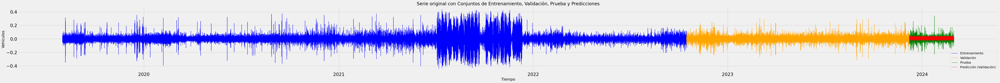

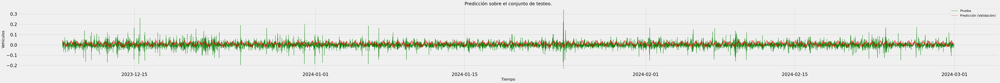

MSE de la prediccion:  0.0012303557


In [ ]:
# Visualización de la serie original y predicciones
plt.figure(figsize=(70, 5))

plt.plot(train_df["bc_diff"], label="Entrenamiento", color="blue", lw=1)  # Graficar train
plt.plot(val_df["bc_diff"], label="Validación", color="orange", lw=1)     # Graficar validacion
plt.plot(test_df["bc_diff"], label="Prueba", color="green", lw=1)         # Graficar test

plt.plot(test_df["bc_diff"].index, prediction, label="Predicción (Validación)", color="red", linestyle="--", lw=1)  # Superponer las predicciones sobre el conjunto de testeo

plt.xlabel("Tiempo")
plt.ylabel("Vehículos")
plt.title("Serie original con Conjuntos de Entrenamiento, Validación, Prueba y Predicciones")
plt.legend()

plt.show()

# Visualización test y predicciones
plt.figure(figsize=(70, 5))

plt.plot(test_df["bc_diff"], label="Prueba", color="green", lw=1)  # Graficar test
plt.plot(test_df["bc_diff"].index, prediction, label="Predicción (Validación)", color="red", linestyle="--", lw=1)  # Superponer las predicciones

plt.xlabel("Tiempo")
plt.ylabel("Vehículos")
plt.title("Predicción sobre el conjunto de testeo.")
plt.legend()

plt.show()

test_flow = test_ts[0, :, 0].cpu().detach().numpy().flatten()
print("MSE de la prediccion: ", mean_squared_error(test_flow, prediction))

### Horario

In [ ]:
vehiculos_data = horario_transf[['bc_diff', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']]           # resample por horas

batch_size = 1                                      # Procesamos toda la serie como un solo batch
timesteps = len(vehiculos_data)                     # Número de pasos en el tiempo
features = 6                                        # Solo tenemos una característica: 'vehiculos'


In [ ]:
vehiculos_data.head()

,bc_diff,presion,temp,humedad,viento_vel,lluvia
2019-08-01 01:00:00,-0.043035,0.570999,0.363218,0.289062,0.024770,0.0
2019-08-01 02:00:00,-0.048225,0.572109,0.341379,0.223958,0.014977,0.0
2019-08-01 03:00:00,-0.049771,0.571166,0.355172,0.151042,0.027074,0.0
2019-08-01 04:00:00,-0.019063,0.571130,0.366092,0.125000,0.023041,0.0
2019-08-01 05:00:00,0.049008,0.572754,0.367816,0.125000,0.023041,0.0


In [ ]:
# se define como train al 70% de los datos, como test el 25% y como validacion el 5%

train = int(len(vehiculos_data) * 0.7) -1
val = int(len(vehiculos_data) * 0.25 + train)
step = int(len(vehiculos_data) * 0.25)
forecast = len(vehiculos_data) - val

train_df = vehiculos_data[:train]
val_df = vehiculos_data[train : val]
test_df = vehiculos_data[val:]
train_val_df = vehiculos_data[:val]

# Convertir los datos en tensores de PyTorch
train_ts = df_to_tensor(train_df)
val_ts = df_to_tensor(val_df)
test_ts = df_to_tensor(test_df)
train_val_ts = df_to_tensor(train_val_df)


# mandamos los tensores a la gpu
train_ts = train_ts.to(device)
val_ts = val_ts.to(device)
test_ts = test_ts.to(device)
train_val_ts = train_val_ts.to(device)


In [ ]:
num_steps_forecast = len(val_df)  # Número de pasos a predecir

# Definimos los hiperparámetros a explorar y creamos la grilla
param_grid = {
    'model_dim': [8, 16, 32, 64, 128, 256, 512],     # Dimensión del modelo
    'layers': [1, 2, 3],              # Número de capas
    'heads': [4, 8],                  # Número de cabezas de atención
    'K': [2, 4, 8],                   # Limitar K a frecuencias disponibles
    'dropout': [0.1, 0.2, 0.3],       # Tasa de dropout
    'batch_size': [8, 16, 32, 64, 128, 256, 512]      # Tamaño de lote a optimizar
}
grid = list(product(*param_grid.values()))

best_error = float('inf')
best_params = None

# Grid Search
for params in grid:
    model_dim, layers, heads, K, dropout, batch_size = params

    try:
        model = ETSFormer(
            time_features=features,
            model_dim=model_dim,
            embed_kernel_size=3,
            layers=layers,
            heads=heads,
            K=K,
            dropout=dropout
        ).to(device)

        # mse del modelo
        error = evaluate_model(model, train_ts, val_ts, batch_size, num_steps_forecast)

        # Guardar los mejores hiperparámetros
        if error < best_error:
            best_error = error
            best_params = params

        print(f"Evaluado: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}, Error={error}")

    except Exception as e:
        # Capturar cualquier error y continuar con la siguiente iteración
        print(f"Error con los parámetros: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}")
        print(f"Mensaje de error: {e}")

    # Liberar memoria de la GPU después de cada iteración
    torch.cuda.empty_cache()

# Mostrar los mejores hiperparámetros
print(f"Mejores hiperparámetros: {best_params}, Mejor Error: {best_error}")


Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=8, MSE=0.3696877956390381
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=16, MSE=0.9891059994697571
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=32, MSE=0.2921319305896759
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=64, MSE=0.5763044357299805
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=128, MSE=0.7777546048164368
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=256, MSE=0.567786455154419
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=512, MSE=0.33465883135795593
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=8, MSE=0.6119905710220337
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=16, MSE=0.8974749445915222
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=32, MSE=0.8959963321685791
Evaluado: model_dim

In [ ]:
model_dim, layers, heads, K, dropout, batch_size = best_params[0], best_params[1], best_params[2], best_params[3], best_params[4], best_params[5]

In [ ]:
# Mejores hiperparámetros: (128, 1, 8, 4, 0.1, 256), Mejor MAE:  0.03606531769037247
model_dim, layers, heads, K, dropout, batch_size = 128, 1, 8, 4, 0.1, 256

In [ ]:
# Mejores hiperparámetros: (128, 1, 8, 4, 0.1, 256), Mejor MSE: 0.0025973087176680565
model_dim, layers, heads, K, dropout, batch_size = 128, 1, 8, 4, 0.1, 256

In [ ]:
# creamos el modelo con los hiperparámetros optimizados
model = ETSFormer(
    time_features = features,
    model_dim = model_dim,
    embed_kernel_size = 3,
    layers = layers,
    heads = heads,
    K = K,
    dropout = dropout
)


model = model.to(device)  # Mover el modelo a la GPU

In [ ]:
num_steps_forecast = len(test_ts[0])  # Número de pasos a predecir

# Verificar si hay fragmentación de memoria y usar memoria expandible si es necesario
%env PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

# predecimos
prediction = predict_in_batches(model, train_val_ts, batch_size, num_steps_forecast)

# Configurar para liberar memoria no utilizada
torch.cuda.empty_cache()

env: PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True


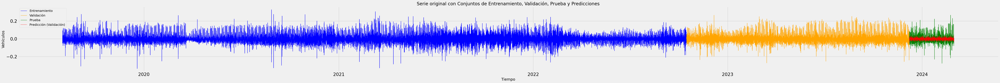

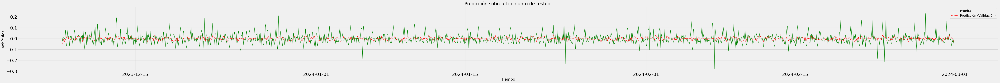

MSE de la prediccion:  0.0021653643


In [ ]:
# Visualización de la serie original y predicciones
plt.figure(figsize=(70, 5))

plt.plot(train_df["bc_diff"], label="Entrenamiento", color="blue", lw=1)  # Graficar train
plt.plot(val_df["bc_diff"], label="Validación", color="orange", lw=1)     # Graficar validacion
plt.plot(test_df["bc_diff"], label="Prueba", color="green", lw=1)         # Graficar test

plt.plot(test_df["bc_diff"].index, prediction, label="Predicción (Validación)", color="red", linestyle="--", lw=1)  # Superponer las predicciones sobre el conjunto de testeo

plt.xlabel("Tiempo")
plt.ylabel("Vehículos")
plt.title("Serie original con Conjuntos de Entrenamiento, Validación, Prueba y Predicciones")
plt.legend()

plt.show()

# Visualización test y predicciones
plt.figure(figsize=(70, 5))

plt.plot(test_df["bc_diff"], label="Prueba", color="green", lw=1)  # Graficar test
plt.plot(test_df["bc_diff"].index, prediction, label="Predicción (Validación)", color="red", linestyle="--", lw=1)  # Superponer las predicciones

plt.xlabel("Tiempo")
plt.ylabel("Vehículos")
plt.title("Predicción sobre el conjunto de testeo.")
plt.legend()

plt.show()

test_flow = test_ts[0, :, 0].cpu().detach().numpy().flatten()
print("MSE de la prediccion: ", mean_squared_error(test_flow, prediction))

### Diario

In [ ]:
vehiculos_data = diario_transf[['bc_diff', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']]            # resample por dias

batch_size = 1                                      # Procesamos toda la serie como un solo batch
timesteps = len(vehiculos_data)                     # Número de pasos en el tiempo
features = 6                                        # Solo tenemos una característica: 'vehiculos'


In [ ]:
# se define como train al 70% de los datos, como test el 25% y como validacion el 5%

train = int(len(vehiculos_data) * 0.7) -1
val = int(len(vehiculos_data) * 0.25 + train)
step = int(len(vehiculos_data) * 0.25)
forecast = len(vehiculos_data) - val

train_df = vehiculos_data[:train]
val_df = vehiculos_data[train : val]
test_df = vehiculos_data[val:]
train_val_df = vehiculos_data[:val]

train_ts = df_to_tensor(train_df)
val_ts = df_to_tensor(val_df)
test_ts = df_to_tensor(test_df)
train_val_ts = df_to_tensor(train_val_df)

# mandamos los tensores a la gpu
train_ts = train_ts.to(device)
val_ts = val_ts.to(device)
test_ts = test_ts.to(device)
train_val_ts = train_val_ts.to(device)


In [ ]:
num_steps_forecast = len(val_df)  # Número de pasos a predecir

# Definir los hiperparámetros a explorar y se crea el grid
param_grid = {
    'model_dim': [8, 16, 32, 64, 128, 256, 512],     # Dimensión del modelo
    'layers': [1, 2, 3],              # Número de capas
    'heads': [4, 8],                  # Número de cabezas de atención
    'K': [2, 4, 8],                   # Limitar K a frecuencias disponibles
    'dropout': [0.1, 0.2, 0.3],       # Tasa de dropout
    'batch_size': [8, 16, 32, 64, 128, 256, 512]      # Tamaño de lote a optimizar
}
grid = list(product(*param_grid.values()))

# Variables para almacenar los mejores hiperparámetros
best_error = float('inf')
best_params = None

# Grid Search
for params in grid:
    model_dim, layers, heads, K, dropout, batch_size = params

    try:
        # Crear el modelo con los hiperparámetros actuales
        model = ETSFormer(
            time_features=features,
            model_dim=model_dim,
            embed_kernel_size=3,
            layers=layers,
            heads=heads,
            K=K,
            dropout=dropout
        ).to(device)

        # Evaluar el modelo en el conjunto de validación
        error = evaluate_model(model, train_ts, val_ts, batch_size, num_steps_forecast)

        # Guardar los mejores hiperparámetros
        if error < best_error:
            best_error = error
            best_params = params

        print(f"Evaluado: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}, Error={error}")

    except Exception as e:
        # Capturar cualquier error y continuar con la siguiente iteración
        print(f"Error con los parámetros: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}")
        print(f"Mensaje de error: {e}")

    # Liberar memoria de la GPU después de cada iteración
    torch.cuda.empty_cache()

# Mostrar los mejores hiperparámetros
print(f"Mejores hiperparámetros: {best_params}, Mejor Error: {best_error}")


Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=8, Error=0.3378271460533142
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=16, Error=0.26489341259002686
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=32, Error=0.8744322061538696
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=64, Error=0.7279051542282104
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=128, Error=0.3930111825466156
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=256, Error=0.4824153184890747
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=512, Error=0.12230877578258514
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=8, Error=0.3862072825431824
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=16, Error=0.5726985931396484
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=32, Error=0.80247306823730

In [ ]:
model_dim, layers, heads, K, dropout, batch_size = best_params[0], best_params[1], best_params[2], best_params[3], best_params[4], best_params[5]

In [ ]:
# Mejores hiperparámetros: (512, 1, 4, 2, 0.2, 256), Mejor Error: 0.05716266483068466
model_dim, layers, heads, K, dropout, batch_size = 12, 1, 4, 2, 0.2, 256

In [ ]:
# Mejores hiperparámetros: (256, 1, 8, 2, 0.1, 256), Mejor MSE: 0.005173147190362215
model_dim, layers, heads, K, dropout, batch_size = 256, 1, 8, 2, 0.1, 256

In [ ]:
# creamos el modelo
model = ETSFormer(
    time_features = features,
    model_dim = model_dim,          # in paper they use 512
    embed_kernel_size = 3,             # kernel size for 1d conv for input embedding
    layers = layers,                   # number of encoder and corresponding decoder layers
    heads = heads,                     # number of exponential smoothing attention heads
    K = K,                             # num frequencies with highest amplitude to keep (attend to)
    dropout = dropout                  # dropout (in paper they did 0.2)
)


model = model.to(device)  # Mover el modelo a la GPU

In [ ]:
num_steps_forecast = len(test_ts[0])  # Número de pasos a predecir (mismo tamaño que el conjunto de testeo)

# Verificar si hay fragmentación de memoria y usar memoria expandible si es necesario
%env PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

# Usar batching para reducir el tamaño de los datos procesados al mismo tiempo
prediction = predict_in_batches(model, train_val_ts, batch_size, num_steps_forecast)

# torch.cuda.empty_cache()

env: PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True


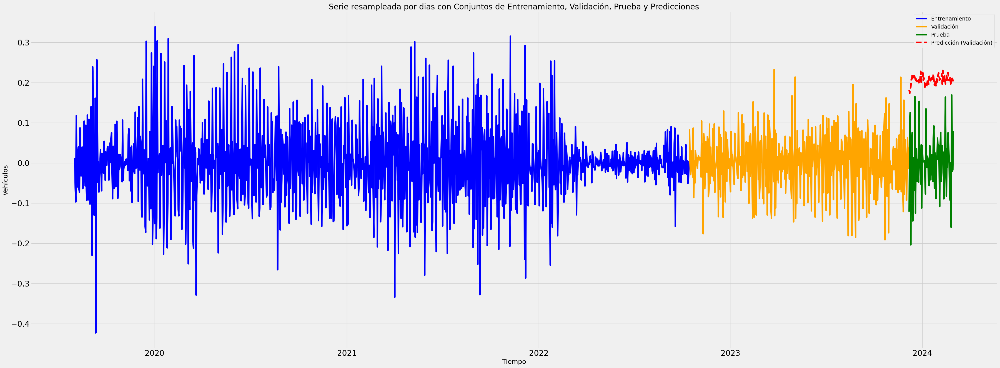

MAE de la prediccion:  0.048178185


In [ ]:
# Visualización de la serie original y predicciones
plt.figure(figsize=(40, 15))

# Graficar los datos de entrenamiento
plt.plot(train_df["bc_diff"], label="Entrenamiento", color="blue")

# Graficar los datos de validación
plt.plot(val_df["bc_diff"], label="Validación", color="orange")

# Graficar los datos de prueba
plt.plot(test_df["bc_diff"], label="Prueba", color="green")

# Superponer las predicciones sobre el conjunto de validación
plt.plot(test_df["bc_diff"].index, prediction, label="Predicción (Validación)", color="red", linestyle="--")

# Configurar etiquetas y título
plt.xlabel("Tiempo")
plt.ylabel("Vehículos")
plt.title("Serie resampleada por dias con Conjuntos de Entrenamiento, Validación, Prueba y Predicciones")
plt.legend()

# Mostrar gráfico
plt.show()

test_flow = test_ts[0, :, 0].cpu().detach().numpy().flatten()
print("MAE de la prediccion: ", mean_squared_error(test_flow, prediction))

### Semanal

In [ ]:
vehiculos_data = semanal_transf[['bc_diff', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']]    # resample por semanas

batch_size = 1                                      # Procesamos toda la serie como un solo batch
timesteps = len(vehiculos_data)                     # Número de pasos en el tiempo
features = 6                                        # Solo tenemos una característica: 'vehiculos'


In [ ]:
# se define como train al 70% de los datos, como test el 25% y como validacion el 5%

train = int(len(vehiculos_data) * 0.7) -1
val = int(len(vehiculos_data) * 0.25 + train)
step = int(len(vehiculos_data) * 0.25)
forecast = len(vehiculos_data) - val

train_df = vehiculos_data[:train]
val_df = vehiculos_data[train : val]
test_df = vehiculos_data[val:]
train_val_df = vehiculos_data[:val]


# Convertir los datos en tensores de PyTorch
def df_to_tensor(dataframe):
    data = dataframe[['bc_diff', 'presion', 'temp', 'humedad', 'viento_vel', 'lluvia']].values
    return torch.tensor(data, dtype=torch.float32).view(1, -1, data.shape[1])  # Múltiples características

train_ts = df_to_tensor(train_df)
val_ts = df_to_tensor(val_df)
test_ts = df_to_tensor(test_df)
train_val_ts = df_to_tensor(train_val_df)


# mandamos los tensores a la gpu
train_ts = train_ts.to(device)
val_ts = val_ts.to(device)
test_ts = test_ts.to(device)
train_val_ts = train_val_ts.to(device)


In [ ]:
num_steps_forecast = len(val_df)  # Número de pasos a predecir

# Definir los hiperparámetros a explorar y se crea la grilla
param_grid = {
    'model_dim': [8, 16, 32, 64, 128, 256, 512],     # Dimensión del modelo
    'layers': [1, 2, 3],              # Número de capas
    'heads': [4, 8],                  # Número de cabezas de atención
    'K': [2, 4, 8],                   # Limitar K a frecuencias disponibles
    'dropout': [0.1, 0.2, 0.3],       # Tasa de dropout
    'batch_size': [8, 16, 32, 64, 128, 256, 512]      # Tamaño de lote a optimizar
}
grid = list(product(*param_grid.values()))

# Variables para almacenar los mejores hiperparámetros
best_error = float('inf')
best_params = None

# Grid Search
for params in grid:
    model_dim, layers, heads, K, dropout, batch_size = params

    try:
        # Crear el modelo con los hiperparámetros actuales
        model = ETSFormer(
            time_features=features,
            model_dim=model_dim,
            embed_kernel_size=3,
            layers=layers,
            heads=heads,
            K=K,
            dropout=dropout
        ).to(device)

        # Evaluar el modelo en el conjunto de validación
        error = evaluate_model(model, train_ts, val_ts, batch_size, num_steps_forecast)

        # Guardar los mejores hiperparámetros
        if error < best_error:
            best_error = error
            best_params = params

        print(f"Evaluado: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}, Error={error}")

    except Exception as e:
        # Capturar cualquier error y continuar con la siguiente iteración
        print(f"Error con los parámetros: model_dim={model_dim}, layers={layers}, heads={heads}, K={K}, dropout={dropout}, batch_size={batch_size}")
        print(f"Mensaje de error: {e}")

    # Liberar memoria de la GPU después de cada iteración
    torch.cuda.empty_cache()

# Mostrar los mejores hiperparámetros
print(f"Mejores hiperparámetros: {best_params}, Mejor Error: {best_error}")


Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=8, Error=0.4265281558036804
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=16, Error=0.053799331188201904
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=32, Error=0.6771702170372009
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=64, Error=0.6065602898597717
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=128, Error=0.7710288763046265
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=256, Error=0.19953042268753052
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.1, batch_size=512, Error=0.7589378952980042
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=8, Error=0.5818560719490051
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=16, Error=0.7886679172515869
Evaluado: model_dim=8, layers=1, heads=4, K=2, dropout=0.2, batch_size=32, Error=0.3483885228633

In [ ]:
model_dim, layers, heads, K, dropout, batch_size = best_params[0], best_params[1], best_params[2], best_params[3], best_params[4], best_params[5]

In [ ]:
# Mejores hiperparámetros: (512, 1, 4, 4, 0.1, 128), Mejor Error: 0.028057193383574486
model_dim, layers, heads, K, dropout, batch_size = 512, 1, 4, 4, 0.1, 128

In [ ]:
# creamos el modelo
model = ETSFormer(
    time_features = features,
    model_dim = model_dim,              # in paper they use 512
    embed_kernel_size = 3,              # kernel size for 1d conv for input embedding
    layers = layers,                    # number of encoder and corresponding decoder layers
    heads = heads,                      # number of exponential smoothing attention heads
    K = K,                              # num frequencies with highest amplitude to keep (attend to)
    dropout = dropout                   # dropout (in paper they did 0.2)
)


model = model.to(device)  # Mover el modelo a la GPU

In [ ]:
num_steps_forecast = len(test_ts[0])  # Número de pasos a predecir (mismo tamaño que el conjunto de validación)

def predict_in_batches(model, data, batch_size, num_steps_forecast):
    predictions = []
    for i in range(0, len(data), batch_size):
        batch_data = data[:, i:i + batch_size, :]
        with torch.no_grad():
            batch_prediction = model(batch_data, num_steps_forecast=num_steps_forecast)
            predictions.append(batch_prediction)
    return torch.cat(predictions, dim=1)  # Combina las predicciones en un solo tensor

# Verificar si hay fragmentación de memoria y usar memoria expandible si es necesario
%env PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

# Usar batching para reducir el tamaño de los datos procesados al mismo tiempo
batch_size = batch_size
prediction = predict_in_batches(model, train_val_ts, batch_size, num_steps_forecast)

# Configurar para liberar memoria no utilizada
torch.cuda.empty_cache()

env: PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True


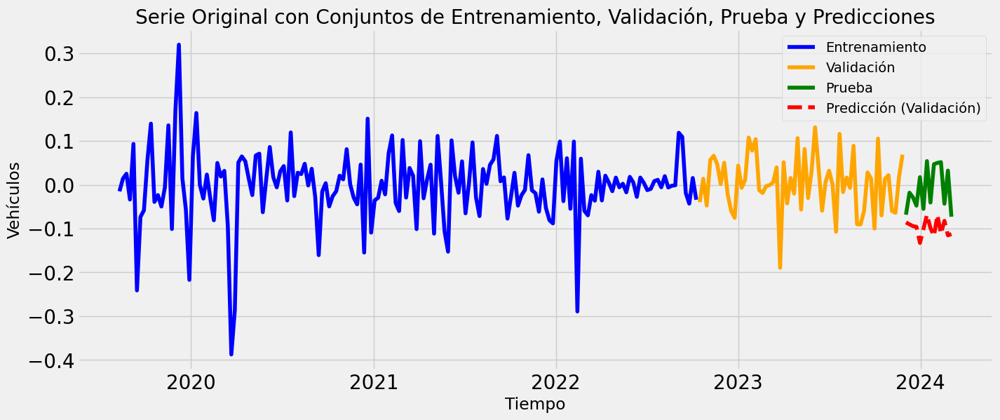

MAE de la prediccion:  0.0895553


In [ ]:
# tomamos la prediccion del flow
pred_flow = prediction[0, :, 0]  # Primer feature

# Convertir la predicción de tensor a NumPy para plotear
prediction_np = pred_flow.cpu().detach().numpy().flatten()

# Visualización de la serie original y predicciones
plt.figure(figsize=(15, 6))

# Graficar los datos de entrenamiento
plt.plot(train_df["bc_diff"], label="Entrenamiento", color="blue")

# Graficar los datos de validación
plt.plot(val_df["bc_diff"], label="Validación", color="orange")

# Graficar los datos de prueba
plt.plot(test_df["bc_diff"], label="Prueba", color="green")

# Superponer las predicciones sobre el conjunto de validación
plt.plot(test_df['bc_diff'].index, prediction_np, label="Predicción (Validación)", color="red", linestyle="--")

# Configurar etiquetas y título
plt.xlabel("Tiempo")
plt.ylabel("Vehículos")
plt.title("Serie Original con Conjuntos de Entrenamiento, Validación, Prueba y Predicciones")
plt.legend()

# Mostrar gráfico
plt.show()

test_flow = test_ts[0, :, 0].cpu().detach().numpy().flatten()
print("MAE de la prediccion: ", mean_absolute_error(test_flow, prediction_np))